## **Dataset**

In [ ]:
!gdown 1JJjMiNieTz7xYs6UeVqd02M3DW4fnEfU
!unzip cvpr2016_flowers.zip

In [ ]:
import os

def load_captions(captions_folder, image_folder):
    captions = {}
    image_files = os.listdir(image_folder)
    for image_file in image_files:
        image_name = image_file.split('.')[0]
        caption_file = os.path.join(captions_folder, image_name + ".txt")
        with open(caption_file, "r") as f:
            caption = f.readlines()[0].strip()
        if image_name not in captions:
                captions[image_name] = caption
    return captions

In [ ]:
captions_folder = "./cvpr2016_flowers/captions"
image_folder = "./cvpr2016_flowers/images"

captions = load_captions(captions_folder, image_folder)

In [ ]:
captions['image_01313']

'flower with multiple white petals peeling back from the center.'

## **Caption Encoder**

In [ ]:
import torch
import numpy as np
from sentence_transformers import SentenceTransformer

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

bert_model = SentenceTransformer("all-mpnet-base-v2").to(device)

def encode_captions(captions):
    encoded_captions = {}
    for image_name in captions.keys():
        caption = captions[image_name]
        encoded_captions[image_name] = {
            'embed': torch.tensor(bert_model.encode(caption)),
            'text': caption
        }
    return encoded_captions

In [ ]:
encoded_captions = encode_captions(captions)

In [ ]:
encoded_captions['image_01313']

{'embed': tensor([ 8.2321e-04, -2.2503e-02, -3.8771e-02,  3.4367e-02, -4.0684e-02,
          9.5354e-03,  3.5113e-02,  3.6865e-02,  6.1961e-02, -9.9160e-03,
          1.1047e-01, -6.6033e-02, -4.7555e-02, -2.5872e-03,  1.5864e-02,
         -2.2544e-02, -7.4908e-03,  1.5508e-02,  6.6533e-02, -3.1364e-02,
          6.6394e-03, -6.6745e-03, -8.4943e-03,  5.8506e-02,  2.8159e-02,
         -6.8209e-02, -3.1168e-02, -3.1902e-02,  1.8016e-02, -2.0944e-02,
          2.8717e-02, -1.7579e-02, -2.6495e-02, -5.7450e-02,  1.3396e-06,
         -3.5225e-02, -1.3897e-02, -3.4884e-03, -7.0081e-03, -2.1350e-02,
         -4.1457e-02, -2.2456e-02,  7.4699e-03,  2.5690e-02,  3.6534e-02,
          1.3188e-02, -1.6613e-02,  7.3492e-02,  8.9742e-03,  4.4904e-02,
          3.7980e-02, -2.5769e-02, -1.0529e-02,  2.7776e-02,  1.9198e-02,
          2.2026e-02,  1.8606e-02, -9.8877e-02, -1.2130e-01, -8.1141e-02,
         -1.5998e-02, -5.0306e-03, -3.2131e-02, -6.8181e-02, -5.1315e-02,
          3.8415e-03, -2.5069

##**Preprocess**


In [ ]:
from PIL import Image
from torch.utils.data import Dataset

class FlowerDataset(Dataset):
    def __init__(self, img_dir, captions, transform=None):
        self.img_dir = img_dir
        self.transform = transform

        # Load captions
        self.captions = captions

        self.img_names = list(self.captions.keys())

    def __len__(self):
        return len(self.img_names)

    def __getitem__(self, idx):
        img_name = self.img_names[idx]
        img_path = os.path.join(self.img_dir, img_name+".jpg")
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        encoded_caption = self.captions[img_name]['embed']
        caption = self.captions[img_name]['text']

        return {
            'image': image,
            'embed_caption': encoded_caption,
            'text': caption
        }

In [ ]:
import torchvision.transforms as transforms

IMG_SIZE = 128

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

ds = FlowerDataset(
    img_dir="./cvpr2016_flowers/images",
    captions=encoded_captions,
    transform=transform
)

In [ ]:
import matplotlib.pyplot as plt

def show_grid(img):
  npimg = img.numpy()
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.show()

In [ ]:
len(ds)

8189

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


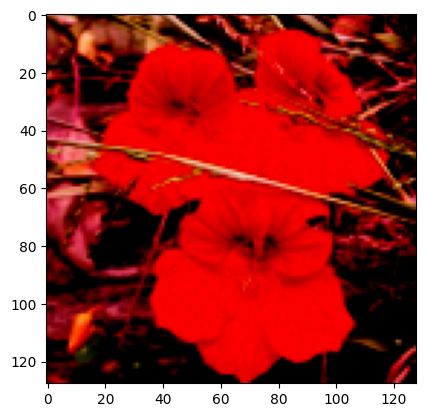

In [ ]:
show_grid(next(iter(ds))['image'])

In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 1024
dataloader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
batch_sample = next(iter(dataloader))

In [ ]:
batch_sample['image'].shape

torch.Size([1024, 3, 128, 128])

In [ ]:
import torchvision

show_grid(torchvision.utils.make_grid(batch_sample['image'], normalize=True))

## **Model**

In [ ]:
import torch.nn as nn

class Generator(nn.Module):

    def __init__(self, noise_size, feature_size, num_channels, embedding_size, reduced_dim_size):
        super(Generator, self).__init__()
        self.reduced_dim_size = reduced_dim_size

        #768-->256
        self.textEncoder = nn.Sequential(
            nn.Linear(in_features = embedding_size, out_features = reduced_dim_size),
            nn.BatchNorm1d(num_features = reduced_dim_size),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True)
        )

        self.upsamplingBlock = nn.Sequential(
            #256+100 --> 1024
            nn.ConvTranspose2d(noise_size + reduced_dim_size, feature_size * 8, 4, 1, 0, bias = False),
            nn.BatchNorm2d(feature_size * 8),
            nn.LeakyReLU(negative_slope = 0.2, inplace = True),

            # 1024 --> 512
            nn.ConvTranspose2d(feature_size * 8, feature_size * 4, 4, 2, 1, bias = False),
            nn.BatchNorm2d(feature_size * 4),
            nn.ReLU(True),

            # 512 --> 256
            nn.ConvTranspose2d(feature_size * 4, feature_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 2),
            nn.ReLU(True),

            # 256 --> 128
            nn.ConvTranspose2d(feature_size * 2, feature_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size),
            nn.ReLU(True),

            # 128 --> 128
            nn.ConvTranspose2d(feature_size, feature_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size),
            nn.ReLU(True),

            # 128 --> 3
            nn.ConvTranspose2d(feature_size, num_channels, 4, 2, 1, bias=False),
            nn.Tanh()

        )

    def forward(self, noise, text_embeddings):
        encoded_text = self.textEncoder(text_embeddings)
        concat_input = torch.cat([noise, encoded_text], dim = 1).unsqueeze(2).unsqueeze(2)
        output = self.upsamplingBlock(concat_input)
        return output

In [ ]:
generator = Generator(100, 128, 3, 768, 256).to(device)

In [ ]:
generator

Generator(
  (textEncoder): Sequential(
    (0): Linear(in_features=768, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (upsamplingBlock): Sequential(
    (0): ConvTranspose2d(356, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), str

In [ ]:
class Discriminator(nn.Module):

    def __init__(self, num_channels, feature_size, embedding_size, reduced_dim_size):
        super(Discriminator, self).__init__()
        self.reduced_dim_size = reduced_dim_size

        self.imageEncoder = nn.Sequential(
            # 3 -> 128
            nn.Conv2d(num_channels, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # 128 -> 128
            nn.Conv2d(feature_size, feature_size, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace = True),

            # 128 -> 256
            nn.Conv2d(feature_size, feature_size * 2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(feature_size * 2),
            nn.LeakyReLU(0.2, inplace = True),

            # 256 -> 512
            nn.Conv2d(feature_size * 2, feature_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # 512 -> 1024
            nn.Conv2d(feature_size * 4, feature_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_size * 8),
            nn.LeakyReLU(0.2, inplace=True),

        )

        self.textEncoder = nn.Sequential(
            nn.Linear(in_features=embedding_size, out_features=reduced_dim_size),
            nn.BatchNorm1d(num_features=reduced_dim_size),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

        self.finalBlock = nn.Sequential(
            nn.Conv2d(feature_size * 8 + reduced_dim_size, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    def forward(self, input_img, text_embeddings):
        image_encoded = self.imageEncoder(input_img)

        text_encoded = self.textEncoder(text_embeddings)

        replicated_text = text_encoded.repeat(4, 4, 1, 1).permute(2,  3, 0, 1)
        concat_layer = torch.cat([image_encoded, replicated_text], 1)

        x = self.finalBlock(concat_layer)

        return x.view(-1, 1)

In [ ]:
discriminator = Discriminator(3, 128, 768, 256).to(device)

In [ ]:
discriminator

Discriminator(
  (imageEncoder): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (11): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): LeakyReLU(negati

In [ ]:
bce_loss = nn.BCELoss()

In [ ]:
plt_o_text_embeddings = ds[0]['embed_caption'].unsqueeze(0)
plt_o_text_embeddings.shape

torch.Size([1, 768])

In [ ]:
fixed_noise = torch.randn(size=(1, 100))
fixed_noise.shape

torch.Size([1, 100])

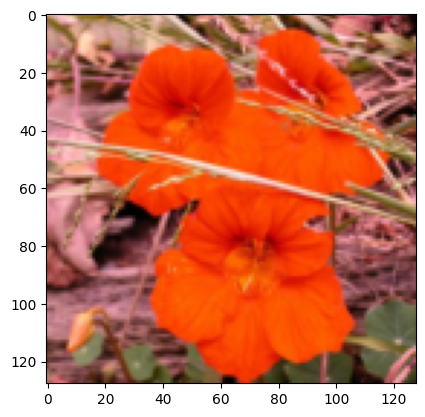

In [ ]:
show_grid(torchvision.utils.make_grid(ds[0]['image'], normalize=True))

## **Training**

In [ ]:
def plot_output(generator):
  plt.clf()
  with torch.no_grad():

    generator.eval()
    test_images = generator(fixed_noise.to(device), plt_o_text_embeddings.to(device))
    generator.train()

    grid = torchvision.utils.make_grid(test_images.cpu(), normalize=True)
    show_grid(grid)

In [ ]:
import torch.optim as optim

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
criterion = nn.BCELoss()

Epoch [1/500] loss_D: 3.7163 loss_G: 8.9484 time: 28.84
Epoch [2/500] loss_D: 1.6001 loss_G: 5.6830 time: 26.06
Epoch [3/500] loss_D: 1.5994 loss_G: 3.6326 time: 26.12
Epoch [4/500] loss_D: 0.6256 loss_G: 2.9638 time: 26.09
Epoch [5/500] loss_D: 1.1525 loss_G: 5.6117 time: 26.17
Epoch [6/500] loss_D: 0.4588 loss_G: 4.6739 time: 27.05
Epoch [7/500] loss_D: 1.8041 loss_G: 3.8988 time: 27.85
Epoch [8/500] loss_D: 0.8817 loss_G: 3.2623 time: 26.23
Epoch [9/500] loss_D: 0.7794 loss_G: 3.6250 time: 26.12


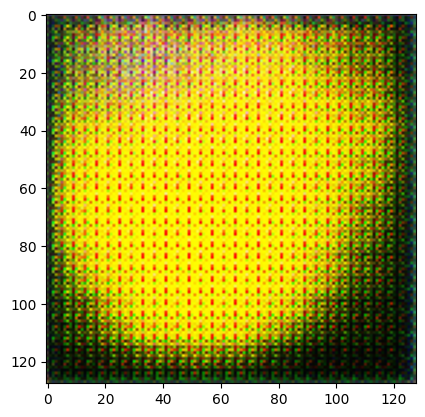

Epoch [10/500] loss_D: 0.7470 loss_G: 4.1685 time: 26.32
Epoch [11/500] loss_D: 0.9982 loss_G: 3.0045 time: 26.13
Epoch [12/500] loss_D: 0.8128 loss_G: 2.3534 time: 26.15
Epoch [13/500] loss_D: 1.1094 loss_G: 2.1567 time: 26.15
Epoch [14/500] loss_D: 0.6435 loss_G: 2.3691 time: 26.16
Epoch [15/500] loss_D: 1.2686 loss_G: 2.0044 time: 26.14
Epoch [16/500] loss_D: 1.2287 loss_G: 2.2066 time: 26.24
Epoch [17/500] loss_D: 1.5157 loss_G: 2.3565 time: 26.14
Epoch [18/500] loss_D: 0.7455 loss_G: 1.7763 time: 26.15
Epoch [19/500] loss_D: 0.4975 loss_G: 3.0989 time: 26.13


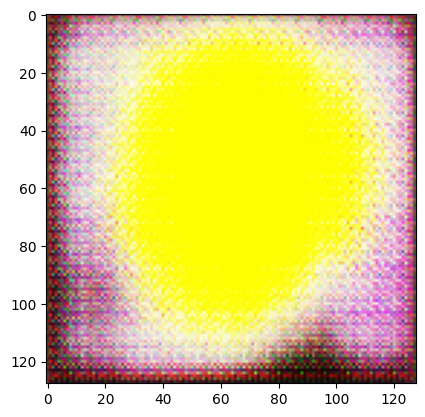

Epoch [20/500] loss_D: 1.3756 loss_G: 2.3241 time: 26.26
Epoch [21/500] loss_D: 0.8618 loss_G: 2.4399 time: 26.16
Epoch [22/500] loss_D: 1.3900 loss_G: 2.4197 time: 26.12
Epoch [23/500] loss_D: 1.0271 loss_G: 2.3607 time: 26.19
Epoch [24/500] loss_D: 0.9714 loss_G: 3.7883 time: 26.14
Epoch [25/500] loss_D: 1.2128 loss_G: 2.5198 time: 26.18
Epoch [26/500] loss_D: 1.5648 loss_G: 2.4529 time: 26.24
Epoch [27/500] loss_D: 1.1337 loss_G: 1.7478 time: 26.19
Epoch [28/500] loss_D: 1.0194 loss_G: 2.6275 time: 26.20
Epoch [29/500] loss_D: 1.3945 loss_G: 2.8846 time: 26.21


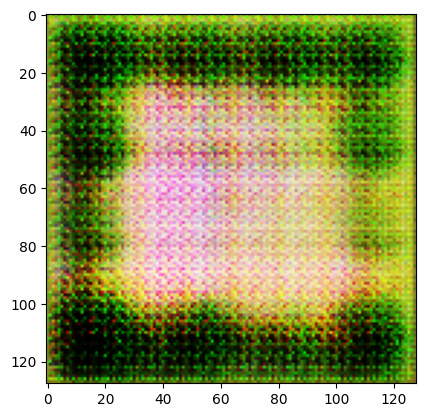

Epoch [30/500] loss_D: 0.8382 loss_G: 3.2158 time: 26.33
Epoch [31/500] loss_D: 1.0175 loss_G: 2.0774 time: 26.18
Epoch [32/500] loss_D: 0.9551 loss_G: 2.8202 time: 26.19
Epoch [33/500] loss_D: 1.1410 loss_G: 3.1450 time: 26.18
Epoch [34/500] loss_D: 0.9280 loss_G: 2.9632 time: 26.19
Epoch [35/500] loss_D: 1.4784 loss_G: 1.8573 time: 26.14
Epoch [36/500] loss_D: 0.9371 loss_G: 1.7069 time: 26.18
Epoch [37/500] loss_D: 1.1074 loss_G: 2.4877 time: 26.00
Epoch [38/500] loss_D: 0.9091 loss_G: 2.8099 time: 25.95
Epoch [39/500] loss_D: 1.0246 loss_G: 2.9098 time: 25.99


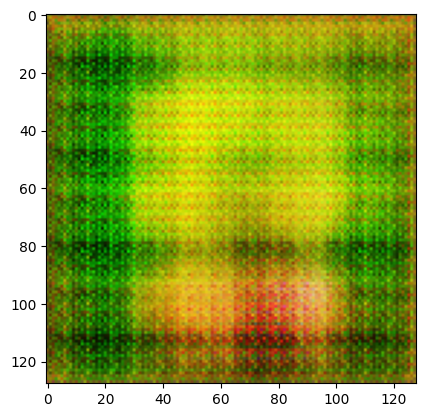

Epoch [40/500] loss_D: 1.0103 loss_G: 2.7474 time: 26.09
Epoch [41/500] loss_D: 1.1777 loss_G: 3.7609 time: 25.95
Epoch [42/500] loss_D: 1.4052 loss_G: 2.3276 time: 25.97
Epoch [43/500] loss_D: 1.0024 loss_G: 2.2674 time: 25.95
Epoch [44/500] loss_D: 1.2299 loss_G: 2.3188 time: 25.98
Epoch [45/500] loss_D: 0.9469 loss_G: 2.1157 time: 25.95
Epoch [46/500] loss_D: 1.0713 loss_G: 2.8199 time: 25.97
Epoch [47/500] loss_D: 0.9087 loss_G: 2.3483 time: 25.94
Epoch [48/500] loss_D: 1.3153 loss_G: 2.6279 time: 25.94
Epoch [49/500] loss_D: 0.8641 loss_G: 2.6777 time: 25.99


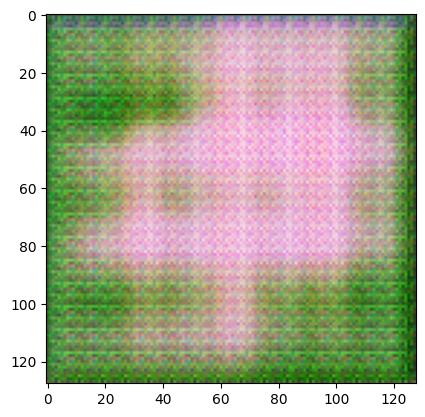

Epoch [50/500] loss_D: 0.7806 loss_G: 2.1997 time: 26.11
Epoch [51/500] loss_D: 0.9884 loss_G: 2.0802 time: 25.99
Epoch [52/500] loss_D: 1.6464 loss_G: 3.1325 time: 25.97
Epoch [53/500] loss_D: 0.7877 loss_G: 1.9364 time: 25.96
Epoch [54/500] loss_D: 0.7738 loss_G: 2.3659 time: 26.00
Epoch [55/500] loss_D: 0.8166 loss_G: 2.5547 time: 26.00
Epoch [56/500] loss_D: 1.1923 loss_G: 2.8590 time: 25.99
Epoch [57/500] loss_D: 0.8973 loss_G: 2.6416 time: 25.95
Epoch [58/500] loss_D: 1.0376 loss_G: 2.0885 time: 25.92
Epoch [59/500] loss_D: 0.5820 loss_G: 2.6993 time: 26.01


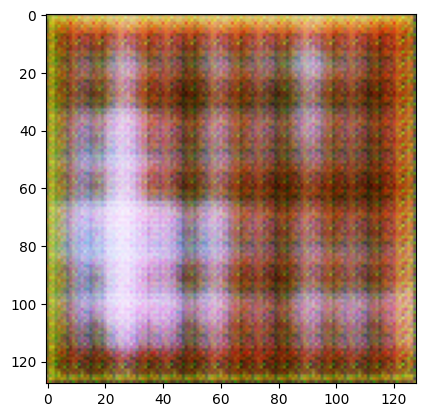

Epoch [60/500] loss_D: 0.7993 loss_G: 2.8484 time: 26.09
Epoch [61/500] loss_D: 1.3282 loss_G: 2.7816 time: 25.99
Epoch [62/500] loss_D: 0.9371 loss_G: 2.2130 time: 25.95
Epoch [63/500] loss_D: 0.9653 loss_G: 2.5359 time: 25.98
Epoch [64/500] loss_D: 1.5272 loss_G: 2.7334 time: 26.04
Epoch [65/500] loss_D: 0.8700 loss_G: 2.2887 time: 26.23
Epoch [66/500] loss_D: 1.0537 loss_G: 2.6286 time: 26.19
Epoch [67/500] loss_D: 1.0329 loss_G: 2.4488 time: 26.24
Epoch [68/500] loss_D: 0.9929 loss_G: 2.6438 time: 26.23
Epoch [69/500] loss_D: 1.3014 loss_G: 2.2138 time: 26.22


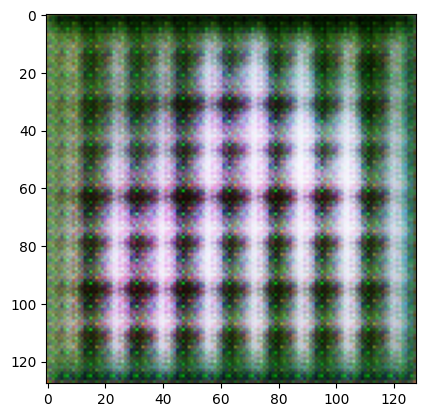

Epoch [70/500] loss_D: 0.8920 loss_G: 2.0877 time: 26.30
Epoch [71/500] loss_D: 1.1454 loss_G: 3.2246 time: 26.14
Epoch [72/500] loss_D: 0.8182 loss_G: 3.0612 time: 26.17
Epoch [73/500] loss_D: 1.4081 loss_G: 2.3960 time: 26.21
Epoch [74/500] loss_D: 0.9234 loss_G: 2.2283 time: 26.16
Epoch [75/500] loss_D: 1.3206 loss_G: 2.6035 time: 26.17
Epoch [76/500] loss_D: 0.8464 loss_G: 2.7673 time: 26.16
Epoch [77/500] loss_D: 1.0983 loss_G: 3.5268 time: 26.20
Epoch [78/500] loss_D: 0.8707 loss_G: 2.9590 time: 26.23
Epoch [79/500] loss_D: 0.9970 loss_G: 3.1315 time: 26.30


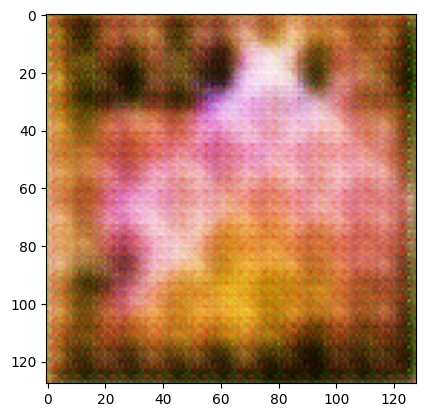

Epoch [80/500] loss_D: 0.7998 loss_G: 3.5627 time: 26.37
Epoch [81/500] loss_D: 1.1604 loss_G: 3.1571 time: 26.18
Epoch [82/500] loss_D: 0.9376 loss_G: 3.2501 time: 26.18
Epoch [83/500] loss_D: 1.0725 loss_G: 2.4594 time: 26.12
Epoch [84/500] loss_D: 0.8469 loss_G: 2.7582 time: 26.04
Epoch [85/500] loss_D: 1.1971 loss_G: 2.3639 time: 26.05
Epoch [86/500] loss_D: 0.8933 loss_G: 2.3050 time: 26.06
Epoch [87/500] loss_D: 1.0576 loss_G: 2.7132 time: 26.08
Epoch [88/500] loss_D: 1.4346 loss_G: 2.8266 time: 26.03
Epoch [89/500] loss_D: 0.9663 loss_G: 2.3754 time: 26.08


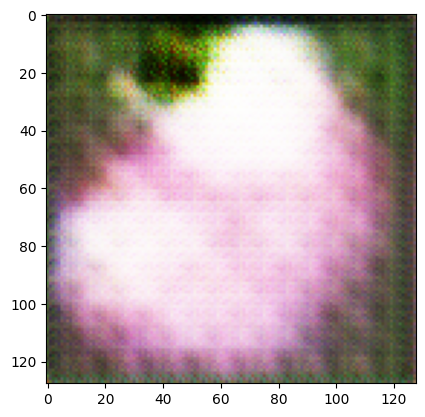

Epoch [90/500] loss_D: 0.9342 loss_G: 2.4746 time: 26.19
Epoch [91/500] loss_D: 0.9312 loss_G: 2.9261 time: 26.06
Epoch [92/500] loss_D: 1.2626 loss_G: 3.1177 time: 26.06
Epoch [93/500] loss_D: 1.0034 loss_G: 2.0507 time: 26.05
Epoch [94/500] loss_D: 1.1283 loss_G: 2.3702 time: 26.04
Epoch [95/500] loss_D: 0.8046 loss_G: 2.2196 time: 26.10
Epoch [96/500] loss_D: 1.0685 loss_G: 2.9159 time: 26.13
Epoch [97/500] loss_D: 0.8937 loss_G: 2.6575 time: 26.11
Epoch [98/500] loss_D: 1.2238 loss_G: 2.6968 time: 26.08
Epoch [99/500] loss_D: 0.9331 loss_G: 2.5293 time: 26.09


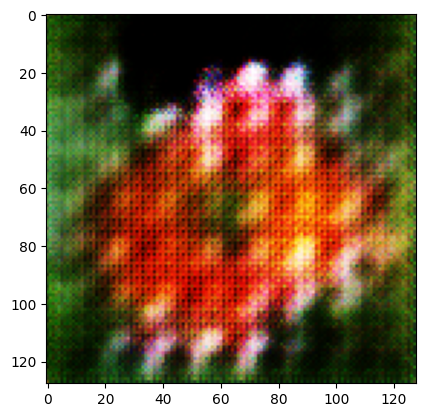

Epoch [100/500] loss_D: 1.0054 loss_G: 2.5151 time: 26.23
Epoch [101/500] loss_D: 0.6843 loss_G: 3.0288 time: 26.12
Epoch [102/500] loss_D: 1.0168 loss_G: 3.0545 time: 26.23
Epoch [103/500] loss_D: 1.1661 loss_G: 2.9895 time: 26.23
Epoch [104/500] loss_D: 0.9141 loss_G: 2.4243 time: 26.15
Epoch [105/500] loss_D: 1.3034 loss_G: 2.8705 time: 26.26
Epoch [106/500] loss_D: 1.2377 loss_G: 2.6028 time: 26.17
Epoch [107/500] loss_D: 0.6674 loss_G: 3.0452 time: 26.20
Epoch [108/500] loss_D: 1.3398 loss_G: 2.9001 time: 26.19
Epoch [109/500] loss_D: 0.9846 loss_G: 2.4379 time: 26.20


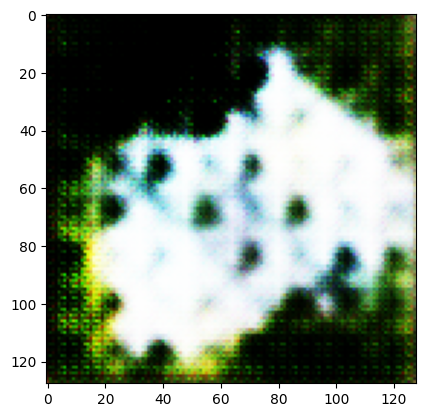

Epoch [110/500] loss_D: 0.7793 loss_G: 2.8104 time: 26.33
Epoch [111/500] loss_D: 0.6728 loss_G: 3.2119 time: 26.23
Epoch [112/500] loss_D: 1.0870 loss_G: 2.9884 time: 26.21
Epoch [113/500] loss_D: 0.6129 loss_G: 2.7860 time: 26.25
Epoch [114/500] loss_D: 1.2833 loss_G: 3.1368 time: 26.25
Epoch [115/500] loss_D: 0.7190 loss_G: 2.7751 time: 26.25
Epoch [116/500] loss_D: 1.1410 loss_G: 3.5188 time: 26.18
Epoch [117/500] loss_D: 0.9224 loss_G: 3.0472 time: 26.18
Epoch [118/500] loss_D: 0.6377 loss_G: 2.8541 time: 26.19
Epoch [119/500] loss_D: 1.0482 loss_G: 3.4826 time: 26.19


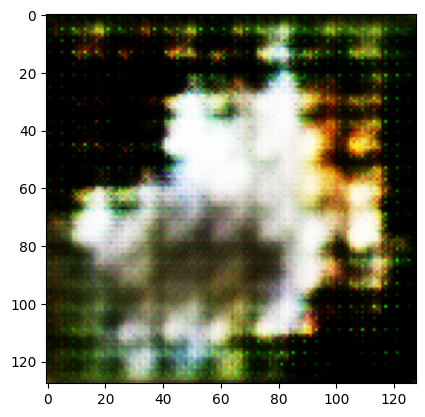

Epoch [120/500] loss_D: 0.9127 loss_G: 2.9012 time: 26.29
Epoch [121/500] loss_D: 0.9358 loss_G: 2.9553 time: 26.16
Epoch [122/500] loss_D: 0.8993 loss_G: 3.0660 time: 26.17
Epoch [123/500] loss_D: 1.2277 loss_G: 2.7430 time: 26.14
Epoch [124/500] loss_D: 0.8189 loss_G: 2.3506 time: 26.17
Epoch [125/500] loss_D: 0.9128 loss_G: 2.6428 time: 26.19
Epoch [126/500] loss_D: 0.5984 loss_G: 3.0378 time: 26.15
Epoch [127/500] loss_D: 1.3145 loss_G: 2.9724 time: 26.19
Epoch [128/500] loss_D: 1.0286 loss_G: 2.7890 time: 26.19
Epoch [129/500] loss_D: 1.0412 loss_G: 2.3435 time: 26.21


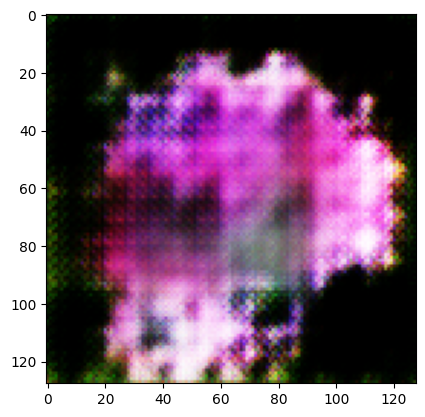

Epoch [130/500] loss_D: 0.9328 loss_G: 2.8089 time: 26.26
Epoch [131/500] loss_D: 1.0602 loss_G: 3.0275 time: 26.13
Epoch [132/500] loss_D: 1.0900 loss_G: 2.6360 time: 26.15
Epoch [133/500] loss_D: 1.0975 loss_G: 3.0451 time: 26.22
Epoch [134/500] loss_D: 1.1154 loss_G: 2.0761 time: 26.15
Epoch [135/500] loss_D: 0.9686 loss_G: 2.6390 time: 26.13
Epoch [136/500] loss_D: 1.1051 loss_G: 2.7420 time: 26.15
Epoch [137/500] loss_D: 0.8514 loss_G: 2.2621 time: 26.15
Epoch [138/500] loss_D: 0.9553 loss_G: 2.8232 time: 26.13
Epoch [139/500] loss_D: 1.0035 loss_G: 2.8201 time: 26.22


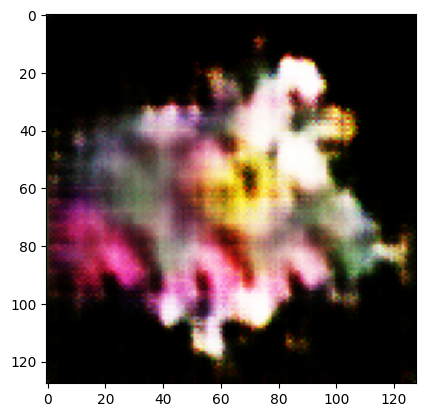

Epoch [140/500] loss_D: 1.1052 loss_G: 2.7193 time: 26.26
Epoch [141/500] loss_D: 1.1221 loss_G: 2.4455 time: 26.33
Epoch [142/500] loss_D: 1.1555 loss_G: 2.5419 time: 26.33
Epoch [143/500] loss_D: 1.0067 loss_G: 2.5636 time: 26.25
Epoch [144/500] loss_D: 1.0517 loss_G: 2.8890 time: 26.21
Epoch [145/500] loss_D: 0.9382 loss_G: 2.4506 time: 26.24
Epoch [146/500] loss_D: 1.0667 loss_G: 3.3633 time: 26.24
Epoch [147/500] loss_D: 1.0497 loss_G: 2.2904 time: 26.25
Epoch [148/500] loss_D: 0.7406 loss_G: 2.9790 time: 26.26
Epoch [149/500] loss_D: 1.0962 loss_G: 3.1183 time: 26.22


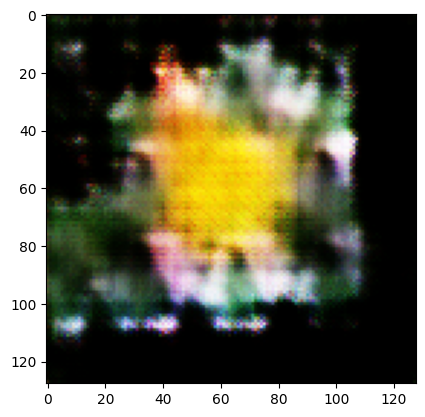

Epoch [150/500] loss_D: 1.2607 loss_G: 3.0814 time: 26.33
Epoch [151/500] loss_D: 0.9712 loss_G: 2.8016 time: 26.22
Epoch [152/500] loss_D: 1.0661 loss_G: 2.6925 time: 26.27
Epoch [153/500] loss_D: 0.9255 loss_G: 2.3290 time: 26.17
Epoch [154/500] loss_D: 1.0429 loss_G: 3.0122 time: 26.12
Epoch [155/500] loss_D: 1.0641 loss_G: 2.6784 time: 26.21
Epoch [156/500] loss_D: 0.9695 loss_G: 2.8037 time: 26.19
Epoch [157/500] loss_D: 0.9581 loss_G: 2.9890 time: 26.13
Epoch [158/500] loss_D: 1.2006 loss_G: 3.1332 time: 26.12
Epoch [159/500] loss_D: 1.0072 loss_G: 2.6454 time: 26.05


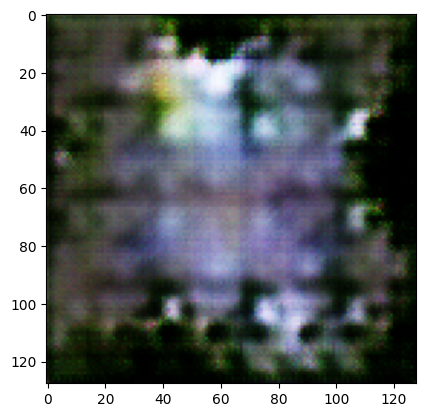

Epoch [160/500] loss_D: 1.1348 loss_G: 3.0705 time: 27.29
Epoch [161/500] loss_D: 0.7359 loss_G: 2.7876 time: 26.92
Epoch [162/500] loss_D: 0.9474 loss_G: 2.9565 time: 26.13
Epoch [163/500] loss_D: 1.3429 loss_G: 3.3758 time: 26.14
Epoch [164/500] loss_D: 1.1459 loss_G: 2.6695 time: 26.25
Epoch [165/500] loss_D: 0.9694 loss_G: 2.3613 time: 26.21
Epoch [166/500] loss_D: 0.9682 loss_G: 2.5504 time: 26.16
Epoch [167/500] loss_D: 1.0049 loss_G: 2.8176 time: 26.23
Epoch [168/500] loss_D: 1.0436 loss_G: 2.8035 time: 26.00
Epoch [169/500] loss_D: 0.9166 loss_G: 2.5469 time: 26.10


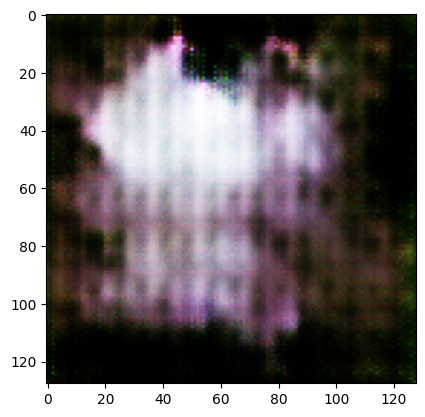

Epoch [170/500] loss_D: 1.1473 loss_G: 2.9038 time: 26.03
Epoch [171/500] loss_D: 1.0097 loss_G: 2.5396 time: 26.03
Epoch [172/500] loss_D: 0.9372 loss_G: 2.9798 time: 25.99
Epoch [173/500] loss_D: 1.2992 loss_G: 2.8546 time: 25.98
Epoch [174/500] loss_D: 0.9561 loss_G: 2.8772 time: 25.99
Epoch [175/500] loss_D: 0.9992 loss_G: 2.7801 time: 26.08
Epoch [176/500] loss_D: 1.0319 loss_G: 2.9008 time: 26.06
Epoch [177/500] loss_D: 1.0314 loss_G: 2.4919 time: 26.05
Epoch [178/500] loss_D: 0.7501 loss_G: 2.6785 time: 26.03
Epoch [179/500] loss_D: 1.0123 loss_G: 3.2382 time: 25.99


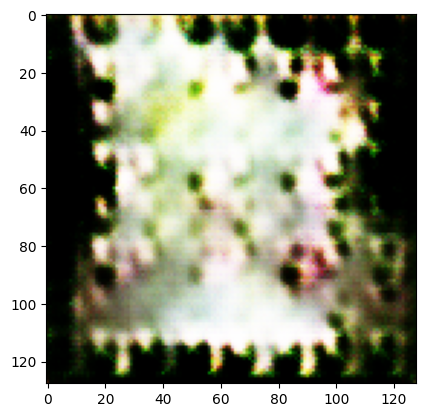

Epoch [180/500] loss_D: 0.9209 loss_G: 3.2696 time: 26.06
Epoch [181/500] loss_D: 0.9894 loss_G: 3.2422 time: 26.03
Epoch [182/500] loss_D: 0.8207 loss_G: 3.1438 time: 25.99
Epoch [183/500] loss_D: 0.9877 loss_G: 2.7030 time: 25.91
Epoch [184/500] loss_D: 1.1565 loss_G: 3.2016 time: 25.97
Epoch [185/500] loss_D: 1.1644 loss_G: 2.2753 time: 25.96
Epoch [186/500] loss_D: 0.9882 loss_G: 2.6464 time: 25.95
Epoch [187/500] loss_D: 1.1321 loss_G: 2.3683 time: 25.93
Epoch [188/500] loss_D: 0.8511 loss_G: 2.7664 time: 25.94
Epoch [189/500] loss_D: 1.0088 loss_G: 3.0389 time: 25.96


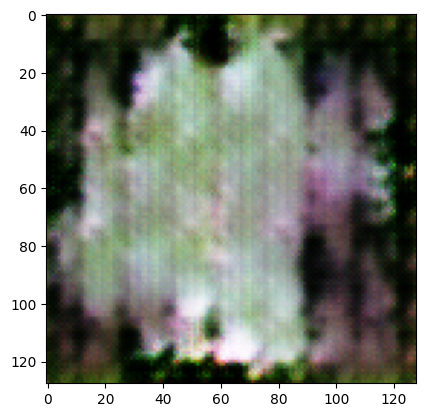

Epoch [190/500] loss_D: 1.2470 loss_G: 3.0108 time: 26.17
Epoch [191/500] loss_D: 0.9292 loss_G: 2.4342 time: 26.23
Epoch [192/500] loss_D: 0.8701 loss_G: 2.7159 time: 26.19
Epoch [193/500] loss_D: 1.0871 loss_G: 2.5254 time: 26.20
Epoch [194/500] loss_D: 0.9026 loss_G: 2.4754 time: 26.22
Epoch [195/500] loss_D: 1.1142 loss_G: 2.4943 time: 26.16
Epoch [196/500] loss_D: 0.9603 loss_G: 2.6052 time: 26.17
Epoch [197/500] loss_D: 0.9137 loss_G: 3.0861 time: 26.13
Epoch [198/500] loss_D: 1.0940 loss_G: 2.6730 time: 26.13
Epoch [199/500] loss_D: 0.9345 loss_G: 2.8722 time: 26.10


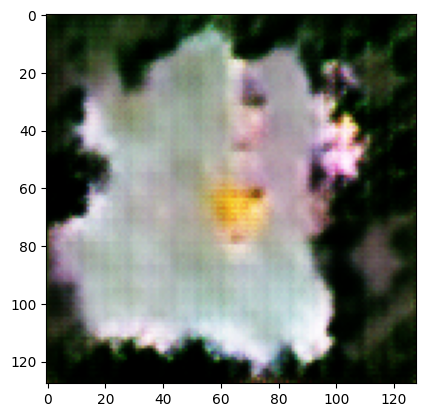

Epoch [200/500] loss_D: 1.0787 loss_G: 2.7407 time: 26.19
Epoch [201/500] loss_D: 1.2399 loss_G: 2.2071 time: 26.12
Epoch [202/500] loss_D: 0.9228 loss_G: 2.3386 time: 26.14
Epoch [203/500] loss_D: 1.1066 loss_G: 2.5934 time: 26.09
Epoch [204/500] loss_D: 0.7906 loss_G: 2.7943 time: 26.23
Epoch [205/500] loss_D: 1.1753 loss_G: 2.9789 time: 26.11
Epoch [206/500] loss_D: 1.0885 loss_G: 3.3868 time: 26.14
Epoch [207/500] loss_D: 0.8788 loss_G: 2.6552 time: 26.18
Epoch [208/500] loss_D: 1.0698 loss_G: 2.6918 time: 26.18
Epoch [209/500] loss_D: 0.8648 loss_G: 2.4876 time: 26.17


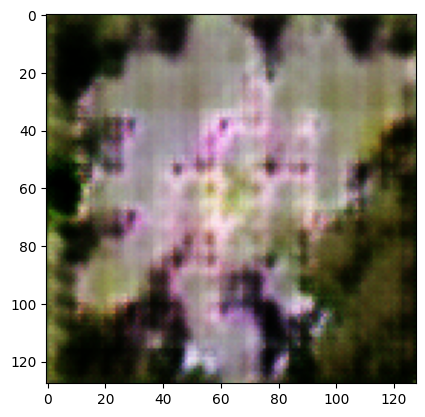

Epoch [210/500] loss_D: 0.9772 loss_G: 2.9569 time: 26.31
Epoch [211/500] loss_D: 1.0359 loss_G: 2.7247 time: 26.22
Epoch [212/500] loss_D: 0.8458 loss_G: 2.8023 time: 26.14
Epoch [213/500] loss_D: 0.8254 loss_G: 3.2288 time: 26.19
Epoch [214/500] loss_D: 1.2229 loss_G: 3.1542 time: 26.19
Epoch [215/500] loss_D: 0.8410 loss_G: 3.1830 time: 26.23
Epoch [216/500] loss_D: 1.1726 loss_G: 2.8300 time: 26.24
Epoch [217/500] loss_D: 0.8894 loss_G: 2.3177 time: 26.19
Epoch [218/500] loss_D: 0.7465 loss_G: 3.0169 time: 26.19
Epoch [219/500] loss_D: 0.8635 loss_G: 3.2640 time: 26.21


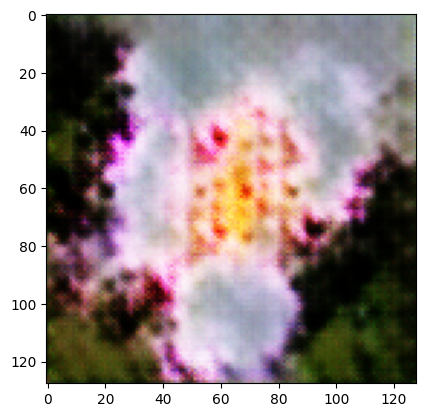

Epoch [220/500] loss_D: 1.0474 loss_G: 3.2580 time: 26.32
Epoch [221/500] loss_D: 0.8514 loss_G: 3.5274 time: 26.18
Epoch [222/500] loss_D: 0.9368 loss_G: 2.8495 time: 26.15
Epoch [223/500] loss_D: 0.8735 loss_G: 2.8494 time: 26.19
Epoch [224/500] loss_D: 1.0685 loss_G: 3.0420 time: 26.18
Epoch [225/500] loss_D: 0.8820 loss_G: 3.0859 time: 26.16
Epoch [226/500] loss_D: 0.9564 loss_G: 2.9878 time: 26.18
Epoch [227/500] loss_D: 0.8882 loss_G: 2.7652 time: 26.17
Epoch [228/500] loss_D: 0.8334 loss_G: 3.0162 time: 26.19
Epoch [229/500] loss_D: 1.2554 loss_G: 2.8105 time: 26.20


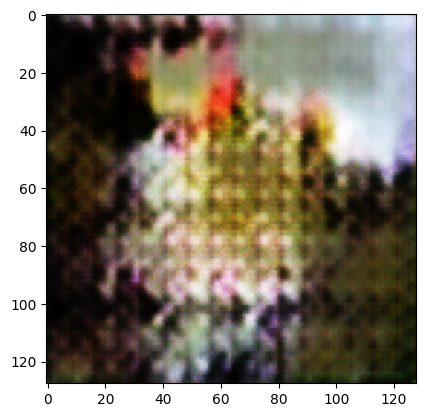

Epoch [230/500] loss_D: 0.7286 loss_G: 2.9210 time: 26.27
Epoch [231/500] loss_D: 0.9716 loss_G: 2.9621 time: 26.22
Epoch [232/500] loss_D: 1.1095 loss_G: 3.4306 time: 26.26
Epoch [233/500] loss_D: 0.7063 loss_G: 2.7475 time: 26.22
Epoch [234/500] loss_D: 1.0027 loss_G: 3.3469 time: 26.23
Epoch [235/500] loss_D: 1.0118 loss_G: 3.2552 time: 26.25
Epoch [236/500] loss_D: 0.9253 loss_G: 2.8414 time: 26.19
Epoch [237/500] loss_D: 0.8670 loss_G: 3.1665 time: 26.23
Epoch [238/500] loss_D: 1.0454 loss_G: 2.9190 time: 26.13
Epoch [239/500] loss_D: 0.9839 loss_G: 3.4010 time: 26.17


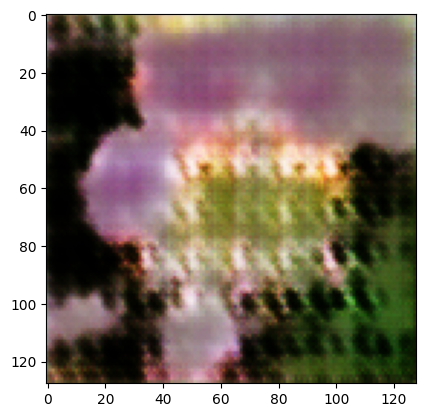

Epoch [240/500] loss_D: 1.0515 loss_G: 2.9252 time: 26.22
Epoch [241/500] loss_D: 0.8268 loss_G: 3.1346 time: 26.23
Epoch [242/500] loss_D: 0.7442 loss_G: 3.2335 time: 26.20
Epoch [243/500] loss_D: 0.8748 loss_G: 3.4395 time: 26.20
Epoch [244/500] loss_D: 1.1230 loss_G: 3.4904 time: 26.23
Epoch [245/500] loss_D: 0.8552 loss_G: 2.9858 time: 26.23
Epoch [246/500] loss_D: 1.1068 loss_G: 3.8277 time: 26.21
Epoch [247/500] loss_D: 0.8747 loss_G: 3.4078 time: 26.18
Epoch [248/500] loss_D: 0.6282 loss_G: 3.2469 time: 26.21
Epoch [249/500] loss_D: 1.1675 loss_G: 3.9028 time: 26.17


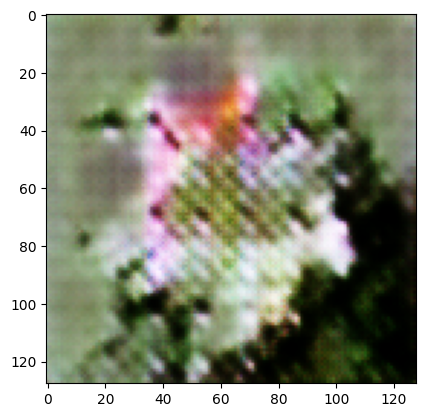

Epoch [250/500] loss_D: 0.7764 loss_G: 3.2001 time: 26.29
Epoch [251/500] loss_D: 0.9787 loss_G: 3.7006 time: 26.20
Epoch [252/500] loss_D: 0.8320 loss_G: 3.1092 time: 26.25
Epoch [253/500] loss_D: 0.7415 loss_G: 2.9775 time: 26.23
Epoch [254/500] loss_D: 1.0393 loss_G: 4.3129 time: 26.24
Epoch [255/500] loss_D: 0.9944 loss_G: 3.3639 time: 26.17
Epoch [256/500] loss_D: 0.8718 loss_G: 3.1685 time: 26.18
Epoch [257/500] loss_D: 0.8116 loss_G: 3.8385 time: 26.25
Epoch [258/500] loss_D: 0.9309 loss_G: 2.9449 time: 26.23
Epoch [259/500] loss_D: 1.0020 loss_G: 3.3882 time: 26.18


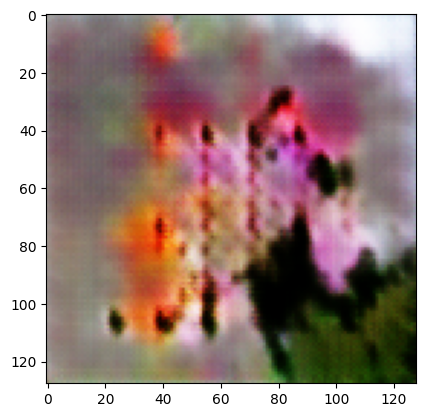

Epoch [260/500] loss_D: 0.9839 loss_G: 2.9971 time: 26.33
Epoch [261/500] loss_D: 1.0500 loss_G: 3.2150 time: 26.18
Epoch [262/500] loss_D: 0.8558 loss_G: 3.1750 time: 26.15
Epoch [263/500] loss_D: 0.8171 loss_G: 3.5960 time: 26.15
Epoch [264/500] loss_D: 0.6207 loss_G: 3.3034 time: 26.17
Epoch [265/500] loss_D: 1.1999 loss_G: 3.2367 time: 26.18
Epoch [266/500] loss_D: 0.8164 loss_G: 3.2843 time: 26.28
Epoch [267/500] loss_D: 0.7444 loss_G: 3.7462 time: 26.36
Epoch [268/500] loss_D: 0.8892 loss_G: 3.8134 time: 26.22
Epoch [269/500] loss_D: 0.8781 loss_G: 3.8226 time: 26.18


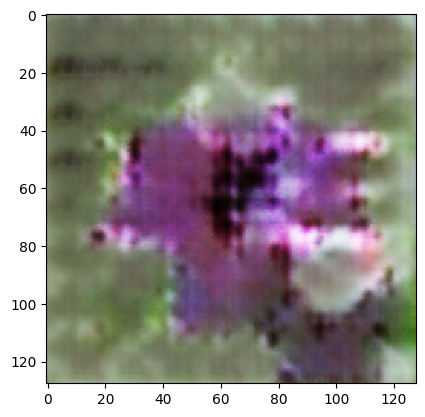

Epoch [270/500] loss_D: 0.9273 loss_G: 3.5924 time: 26.31
Epoch [271/500] loss_D: 0.7511 loss_G: 3.6425 time: 26.21
Epoch [272/500] loss_D: 0.9215 loss_G: 3.6841 time: 26.19
Epoch [273/500] loss_D: 0.9703 loss_G: 3.7851 time: 26.20
Epoch [274/500] loss_D: 0.8168 loss_G: 3.4647 time: 26.22
Epoch [275/500] loss_D: 1.1427 loss_G: 3.6216 time: 26.16
Epoch [276/500] loss_D: 0.8884 loss_G: 3.3108 time: 26.12
Epoch [277/500] loss_D: 0.6413 loss_G: 3.0666 time: 26.16
Epoch [278/500] loss_D: 1.0718 loss_G: 3.9276 time: 26.18
Epoch [279/500] loss_D: 0.7847 loss_G: 3.4557 time: 26.17


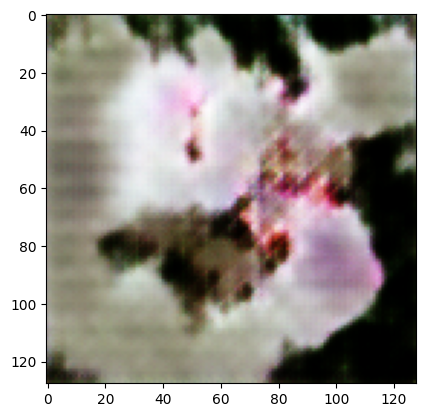

Epoch [280/500] loss_D: 0.8173 loss_G: 4.0109 time: 26.26
Epoch [281/500] loss_D: 0.8641 loss_G: 3.4755 time: 26.23
Epoch [282/500] loss_D: 1.0255 loss_G: 3.9414 time: 26.21
Epoch [283/500] loss_D: 0.7094 loss_G: 3.4800 time: 26.10
Epoch [284/500] loss_D: 0.8453 loss_G: 4.0094 time: 26.13
Epoch [285/500] loss_D: 0.6595 loss_G: 4.0287 time: 26.11
Epoch [286/500] loss_D: 0.7664 loss_G: 4.6399 time: 26.12
Epoch [287/500] loss_D: 0.8644 loss_G: 3.5636 time: 26.11
Epoch [288/500] loss_D: 1.0046 loss_G: 4.2740 time: 26.11
Epoch [289/500] loss_D: 0.8466 loss_G: 3.3342 time: 26.13


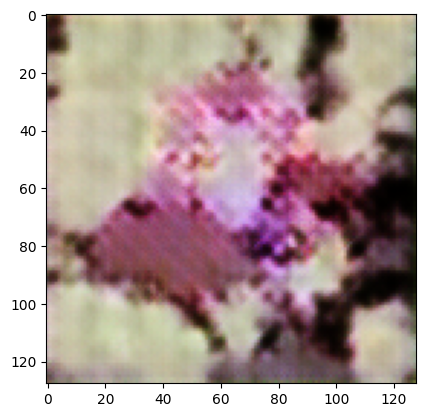

Epoch [290/500] loss_D: 0.7921 loss_G: 3.1812 time: 26.21
Epoch [291/500] loss_D: 0.7834 loss_G: 3.5623 time: 26.21
Epoch [292/500] loss_D: 0.7871 loss_G: 3.5408 time: 26.21
Epoch [293/500] loss_D: 0.8845 loss_G: 3.8426 time: 26.25
Epoch [294/500] loss_D: 1.1250 loss_G: 3.9894 time: 26.21
Epoch [295/500] loss_D: 0.8041 loss_G: 3.3736 time: 26.22
Epoch [296/500] loss_D: 0.8193 loss_G: 3.5967 time: 26.24
Epoch [297/500] loss_D: 0.7439 loss_G: 4.0198 time: 26.38
Epoch [298/500] loss_D: 1.2337 loss_G: 3.4275 time: 26.25
Epoch [299/500] loss_D: 0.8396 loss_G: 3.5818 time: 26.22


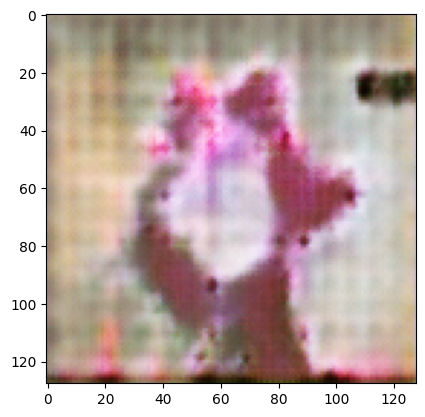

Epoch [300/500] loss_D: 0.7634 loss_G: 3.9140 time: 26.48
Epoch [301/500] loss_D: 1.1132 loss_G: 4.2947 time: 26.19
Epoch [302/500] loss_D: 0.7224 loss_G: 3.5631 time: 26.20
Epoch [303/500] loss_D: 0.9256 loss_G: 3.2812 time: 26.25
Epoch [304/500] loss_D: 0.8334 loss_G: 3.2466 time: 26.28
Epoch [305/500] loss_D: 1.1400 loss_G: 3.6532 time: 26.27
Epoch [306/500] loss_D: 0.7213 loss_G: 3.0550 time: 26.21
Epoch [307/500] loss_D: 0.7614 loss_G: 3.5633 time: 26.15
Epoch [308/500] loss_D: 0.7055 loss_G: 3.8708 time: 26.07
Epoch [309/500] loss_D: 0.8932 loss_G: 3.6587 time: 26.04


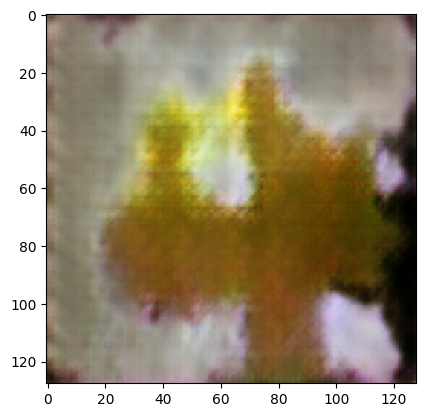

Epoch [310/500] loss_D: 0.8536 loss_G: 3.3951 time: 26.19
Epoch [311/500] loss_D: 0.7239 loss_G: 3.4856 time: 26.04
Epoch [312/500] loss_D: 0.8002 loss_G: 3.7948 time: 26.01
Epoch [313/500] loss_D: 1.0962 loss_G: 4.2150 time: 26.00
Epoch [314/500] loss_D: 0.6801 loss_G: 3.6801 time: 26.01
Epoch [315/500] loss_D: 0.5811 loss_G: 3.9620 time: 26.02
Epoch [316/500] loss_D: 1.0584 loss_G: 3.6497 time: 26.00
Epoch [317/500] loss_D: 0.6574 loss_G: 3.6817 time: 26.00
Epoch [318/500] loss_D: 0.9525 loss_G: 4.2946 time: 26.02
Epoch [319/500] loss_D: 0.5669 loss_G: 3.9196 time: 26.00


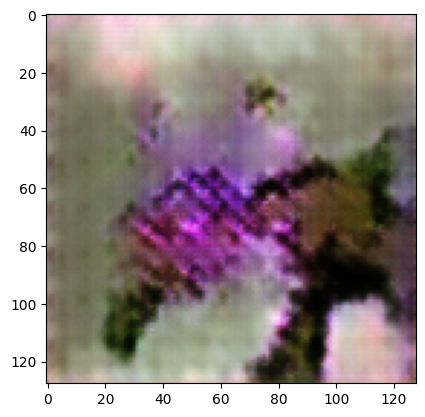

Epoch [320/500] loss_D: 0.7450 loss_G: 4.2296 time: 26.07
Epoch [321/500] loss_D: 0.9603 loss_G: 3.6056 time: 26.17
Epoch [322/500] loss_D: 0.7985 loss_G: 4.5097 time: 26.04
Epoch [323/500] loss_D: 0.8023 loss_G: 4.0991 time: 26.07
Epoch [324/500] loss_D: 0.9177 loss_G: 4.3382 time: 26.16
Epoch [325/500] loss_D: 0.5441 loss_G: 3.8650 time: 26.00
Epoch [326/500] loss_D: 0.7581 loss_G: 3.9669 time: 26.04
Epoch [327/500] loss_D: 1.0990 loss_G: 4.3079 time: 26.01
Epoch [328/500] loss_D: 0.9003 loss_G: 3.5318 time: 26.00
Epoch [329/500] loss_D: 0.6591 loss_G: 3.2467 time: 26.17


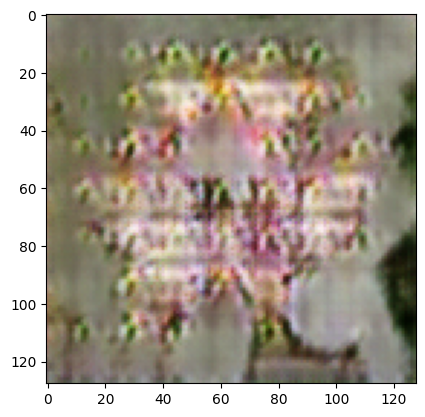

Epoch [330/500] loss_D: 0.6749 loss_G: 4.0256 time: 26.22
Epoch [331/500] loss_D: 1.0570 loss_G: 4.0569 time: 26.08
Epoch [332/500] loss_D: 1.0062 loss_G: 3.7981 time: 26.04
Epoch [333/500] loss_D: 0.7475 loss_G: 3.3988 time: 26.04
Epoch [334/500] loss_D: 0.8092 loss_G: 3.8358 time: 26.04
Epoch [335/500] loss_D: 0.6731 loss_G: 3.8779 time: 26.08
Epoch [336/500] loss_D: 0.7367 loss_G: 3.6335 time: 26.12
Epoch [337/500] loss_D: 0.5582 loss_G: 3.6158 time: 26.10
Epoch [338/500] loss_D: 0.8549 loss_G: 3.6356 time: 26.06
Epoch [339/500] loss_D: 0.9663 loss_G: 4.2877 time: 26.09


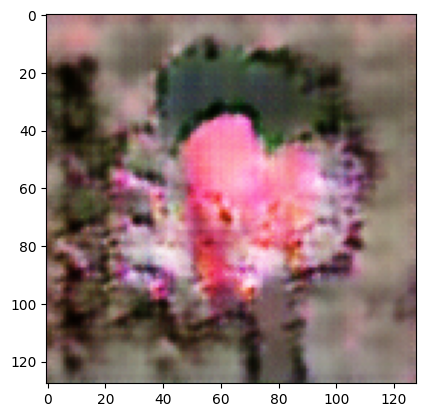

Epoch [340/500] loss_D: 0.9388 loss_G: 3.9036 time: 26.19
Epoch [341/500] loss_D: 1.0124 loss_G: 3.4965 time: 26.13
Epoch [342/500] loss_D: 0.7493 loss_G: 3.4353 time: 26.09
Epoch [343/500] loss_D: 0.9116 loss_G: 4.0611 time: 26.14
Epoch [344/500] loss_D: 0.9710 loss_G: 3.4078 time: 26.10
Epoch [345/500] loss_D: 0.7793 loss_G: 3.0440 time: 26.09
Epoch [346/500] loss_D: 0.8476 loss_G: 3.4946 time: 26.09
Epoch [347/500] loss_D: 0.7130 loss_G: 3.2069 time: 26.06
Epoch [348/500] loss_D: 0.8983 loss_G: 3.5414 time: 26.12
Epoch [349/500] loss_D: 0.7736 loss_G: 3.6910 time: 26.18


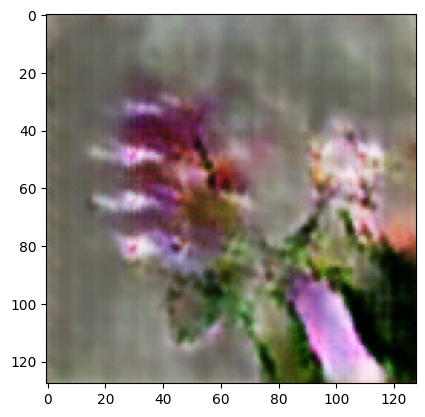

Epoch [350/500] loss_D: 0.7703 loss_G: 3.4306 time: 26.24
Epoch [351/500] loss_D: 0.8276 loss_G: 3.5345 time: 26.04
Epoch [352/500] loss_D: 0.5830 loss_G: 3.5648 time: 26.01
Epoch [353/500] loss_D: 0.8667 loss_G: 4.0503 time: 26.06
Epoch [354/500] loss_D: 1.4272 loss_G: 3.5765 time: 26.14
Epoch [355/500] loss_D: 0.7194 loss_G: 3.5095 time: 26.06
Epoch [356/500] loss_D: 0.6547 loss_G: 3.4059 time: 26.04
Epoch [357/500] loss_D: 0.6814 loss_G: 3.6992 time: 26.11
Epoch [358/500] loss_D: 0.7069 loss_G: 3.6890 time: 26.07
Epoch [359/500] loss_D: 1.2146 loss_G: 4.4637 time: 26.03


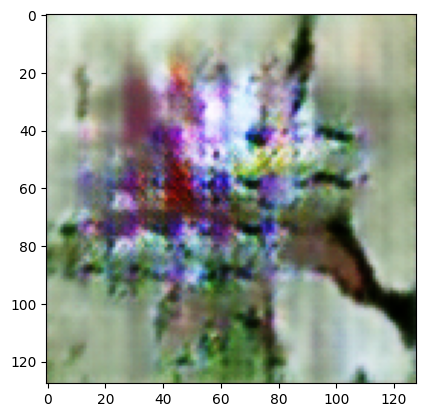

Epoch [360/500] loss_D: 0.8031 loss_G: 4.5234 time: 26.14
Epoch [361/500] loss_D: 0.7759 loss_G: 3.6668 time: 26.02
Epoch [362/500] loss_D: 0.7025 loss_G: 3.6352 time: 26.03
Epoch [363/500] loss_D: 0.7513 loss_G: 3.8521 time: 26.08
Epoch [364/500] loss_D: 0.9481 loss_G: 3.5076 time: 25.97
Epoch [365/500] loss_D: 0.6765 loss_G: 3.7583 time: 25.96
Epoch [366/500] loss_D: 0.7253 loss_G: 3.0735 time: 25.99
Epoch [367/500] loss_D: 0.9970 loss_G: 3.6233 time: 26.04
Epoch [368/500] loss_D: 0.7539 loss_G: 3.6754 time: 26.03
Epoch [369/500] loss_D: 0.8129 loss_G: 4.3338 time: 26.00


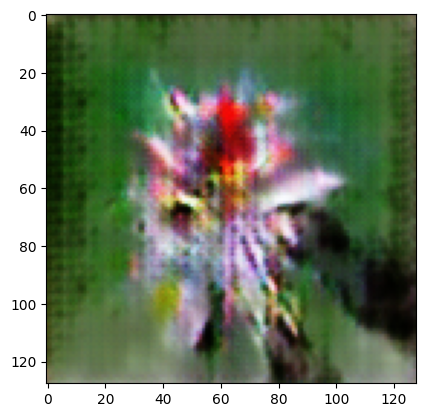

Epoch [370/500] loss_D: 0.8664 loss_G: 3.9869 time: 26.09
Epoch [371/500] loss_D: 0.9351 loss_G: 4.1284 time: 26.17
Epoch [372/500] loss_D: 0.6374 loss_G: 3.6659 time: 26.01
Epoch [373/500] loss_D: 0.8197 loss_G: 3.8069 time: 26.00
Epoch [374/500] loss_D: 0.8310 loss_G: 3.4950 time: 26.01
Epoch [375/500] loss_D: 0.7367 loss_G: 3.7162 time: 26.11
Epoch [376/500] loss_D: 0.7923 loss_G: 3.6981 time: 26.00
Epoch [377/500] loss_D: 0.7875 loss_G: 3.8828 time: 25.99
Epoch [378/500] loss_D: 0.7284 loss_G: 3.7314 time: 25.95
Epoch [379/500] loss_D: 1.0783 loss_G: 4.2841 time: 26.11


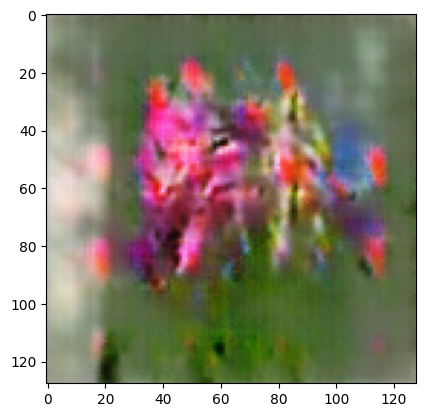

Epoch [380/500] loss_D: 0.6452 loss_G: 4.0153 time: 26.03
Epoch [381/500] loss_D: 0.9125 loss_G: 3.7937 time: 26.01
Epoch [382/500] loss_D: 1.0621 loss_G: 3.9914 time: 25.99
Epoch [383/500] loss_D: 0.7065 loss_G: 3.6605 time: 26.00
Epoch [384/500] loss_D: 0.8390 loss_G: 4.0878 time: 25.98
Epoch [385/500] loss_D: 0.6235 loss_G: 3.3617 time: 26.00
Epoch [386/500] loss_D: 0.8297 loss_G: 3.4872 time: 26.01
Epoch [387/500] loss_D: 0.7145 loss_G: 3.7224 time: 26.11
Epoch [388/500] loss_D: 0.8295 loss_G: 3.2295 time: 26.21
Epoch [389/500] loss_D: 0.6808 loss_G: 3.5781 time: 26.23


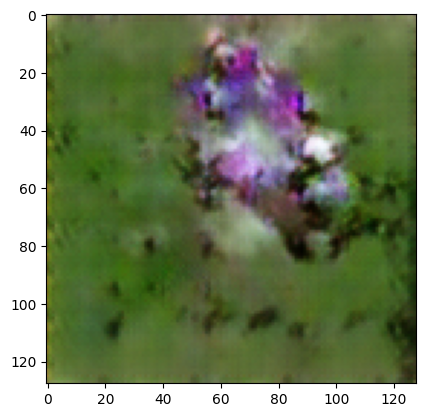

Epoch [390/500] loss_D: 0.6824 loss_G: 3.8019 time: 26.31
Epoch [391/500] loss_D: 0.5340 loss_G: 3.6894 time: 26.24
Epoch [392/500] loss_D: 0.9749 loss_G: 4.1458 time: 26.36
Epoch [393/500] loss_D: 0.9161 loss_G: 3.4001 time: 26.49
Epoch [394/500] loss_D: 0.8911 loss_G: 3.8091 time: 26.31
Epoch [395/500] loss_D: 0.6645 loss_G: 3.5458 time: 26.31
Epoch [396/500] loss_D: 0.8427 loss_G: 3.9374 time: 26.36
Epoch [397/500] loss_D: 0.7056 loss_G: 3.8585 time: 26.34
Epoch [398/500] loss_D: 0.8620 loss_G: 3.6106 time: 26.11
Epoch [399/500] loss_D: 0.7138 loss_G: 3.7887 time: 26.11


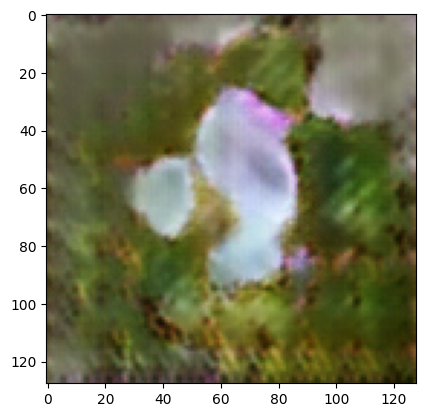

Epoch [400/500] loss_D: 0.9767 loss_G: 4.2603 time: 26.18
Epoch [401/500] loss_D: 0.8121 loss_G: 3.4682 time: 26.00
Epoch [402/500] loss_D: 0.7611 loss_G: 3.5092 time: 26.03
Epoch [403/500] loss_D: 0.6033 loss_G: 3.4628 time: 26.11
Epoch [404/500] loss_D: 1.1147 loss_G: 3.7624 time: 26.29
Epoch [405/500] loss_D: 0.6492 loss_G: 3.1757 time: 26.27
Epoch [406/500] loss_D: 0.6507 loss_G: 3.6846 time: 26.13
Epoch [407/500] loss_D: 1.0040 loss_G: 4.0370 time: 26.01
Epoch [408/500] loss_D: 0.9428 loss_G: 3.7464 time: 26.17
Epoch [409/500] loss_D: 0.6351 loss_G: 3.6276 time: 26.31


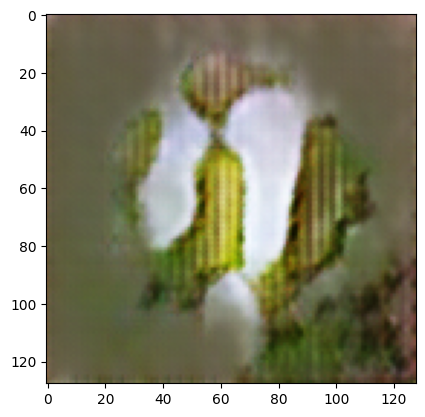

Epoch [410/500] loss_D: 0.7126 loss_G: 3.2068 time: 26.41
Epoch [411/500] loss_D: 0.9071 loss_G: 4.2200 time: 26.33
Epoch [412/500] loss_D: 0.8988 loss_G: 3.7296 time: 26.35
Epoch [413/500] loss_D: 0.7640 loss_G: 3.6999 time: 26.27
Epoch [414/500] loss_D: 0.5944 loss_G: 3.3703 time: 26.28
Epoch [415/500] loss_D: 0.8261 loss_G: 3.7164 time: 26.33
Epoch [416/500] loss_D: 0.9099 loss_G: 3.7002 time: 26.26
Epoch [417/500] loss_D: 0.6226 loss_G: 3.2583 time: 26.26
Epoch [418/500] loss_D: 0.8775 loss_G: 3.5590 time: 26.43
Epoch [419/500] loss_D: 0.7912 loss_G: 3.5548 time: 26.24


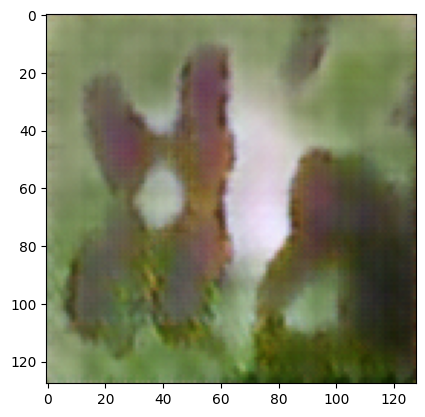

Epoch [420/500] loss_D: 1.2891 loss_G: 4.0251 time: 26.46
Epoch [421/500] loss_D: 0.7855 loss_G: 3.6407 time: 26.28
Epoch [422/500] loss_D: 0.9348 loss_G: 3.6307 time: 26.24
Epoch [423/500] loss_D: 0.6194 loss_G: 3.1733 time: 26.20
Epoch [424/500] loss_D: 0.7111 loss_G: 3.3358 time: 26.18
Epoch [425/500] loss_D: 0.7375 loss_G: 3.4047 time: 26.16
Epoch [426/500] loss_D: 0.7302 loss_G: 3.4676 time: 26.18
Epoch [427/500] loss_D: 0.9306 loss_G: 3.8747 time: 26.21
Epoch [428/500] loss_D: 0.6900 loss_G: 3.5801 time: 26.25
Epoch [429/500] loss_D: 0.7567 loss_G: 3.6376 time: 26.24


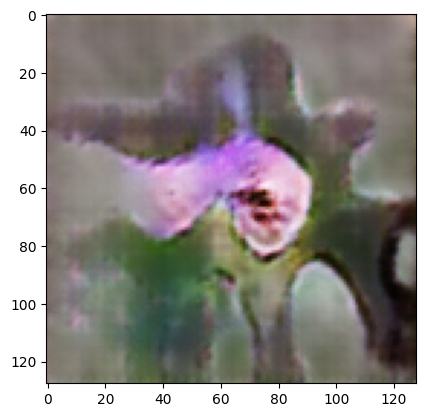

Epoch [430/500] loss_D: 0.7248 loss_G: 3.5150 time: 26.49
Epoch [431/500] loss_D: 0.7684 loss_G: 3.3740 time: 26.26
Epoch [432/500] loss_D: 0.7435 loss_G: 3.5293 time: 26.18
Epoch [433/500] loss_D: 0.8120 loss_G: 3.5206 time: 26.20
Epoch [434/500] loss_D: 0.6260 loss_G: 3.2008 time: 26.25
Epoch [435/500] loss_D: 0.7927 loss_G: 3.5276 time: 26.22
Epoch [436/500] loss_D: 1.0711 loss_G: 3.8840 time: 26.26
Epoch [437/500] loss_D: 0.9424 loss_G: 4.1146 time: 26.17
Epoch [438/500] loss_D: 0.8846 loss_G: 3.0847 time: 26.24
Epoch [439/500] loss_D: 0.7310 loss_G: 3.1863 time: 26.23


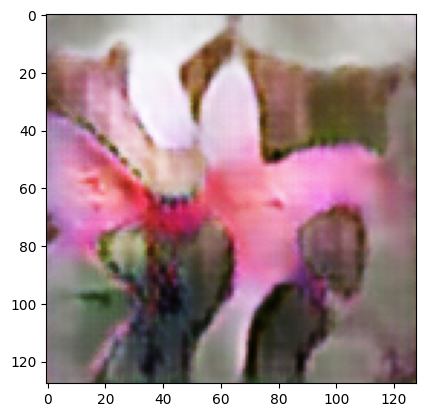

Epoch [440/500] loss_D: 1.0589 loss_G: 4.2590 time: 26.29
Epoch [441/500] loss_D: 0.9661 loss_G: 3.9284 time: 26.19
Epoch [442/500] loss_D: 0.7331 loss_G: 3.5273 time: 26.16
Epoch [443/500] loss_D: 0.6758 loss_G: 3.3287 time: 26.18
Epoch [444/500] loss_D: 0.7286 loss_G: 3.6834 time: 26.22
Epoch [445/500] loss_D: 1.1653 loss_G: 4.0918 time: 26.17
Epoch [446/500] loss_D: 0.8607 loss_G: 3.8832 time: 26.18
Epoch [447/500] loss_D: 0.9169 loss_G: 3.7986 time: 26.21
Epoch [448/500] loss_D: 0.6371 loss_G: 3.4827 time: 26.13
Epoch [449/500] loss_D: 0.7976 loss_G: 3.8696 time: 26.13


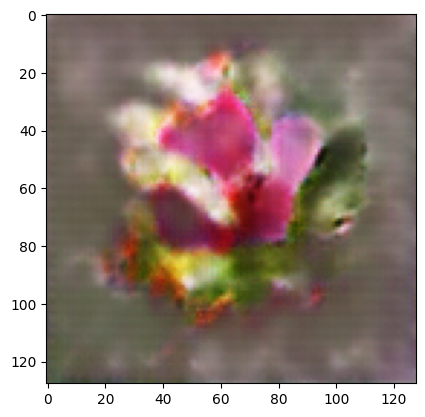

Epoch [450/500] loss_D: 0.7502 loss_G: 3.4034 time: 26.29
Epoch [451/500] loss_D: 0.8176 loss_G: 3.6844 time: 26.21
Epoch [452/500] loss_D: 0.8332 loss_G: 3.6826 time: 26.14
Epoch [453/500] loss_D: 0.7230 loss_G: 4.0618 time: 26.16
Epoch [454/500] loss_D: 0.7267 loss_G: 3.3619 time: 26.21
Epoch [455/500] loss_D: 0.7067 loss_G: 3.6200 time: 26.28
Epoch [456/500] loss_D: 0.8319 loss_G: 3.5774 time: 26.21
Epoch [457/500] loss_D: 0.9330 loss_G: 3.8653 time: 26.16
Epoch [458/500] loss_D: 0.6554 loss_G: 3.0969 time: 26.19
Epoch [459/500] loss_D: 0.6561 loss_G: 3.2499 time: 26.21


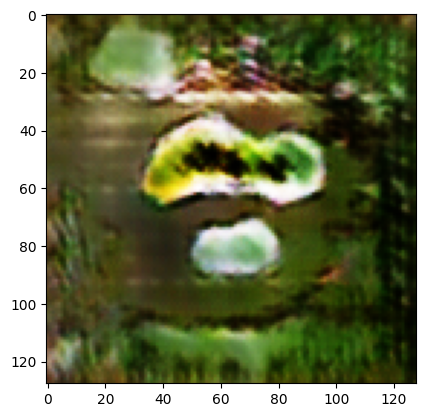

Epoch [460/500] loss_D: 0.6850 loss_G: 3.6906 time: 26.53
Epoch [461/500] loss_D: 1.0114 loss_G: 4.6654 time: 26.21
Epoch [462/500] loss_D: 0.9624 loss_G: 3.4026 time: 26.18
Epoch [463/500] loss_D: 0.6634 loss_G: 3.5905 time: 26.23
Epoch [464/500] loss_D: 0.9002 loss_G: 3.6984 time: 26.21
Epoch [465/500] loss_D: 0.5826 loss_G: 3.3461 time: 26.16
Epoch [466/500] loss_D: 0.8894 loss_G: 3.7226 time: 26.21
Epoch [467/500] loss_D: 0.7937 loss_G: 3.6014 time: 26.14
Epoch [468/500] loss_D: 0.6382 loss_G: 3.6609 time: 26.16
Epoch [469/500] loss_D: 1.3493 loss_G: 4.1782 time: 26.10


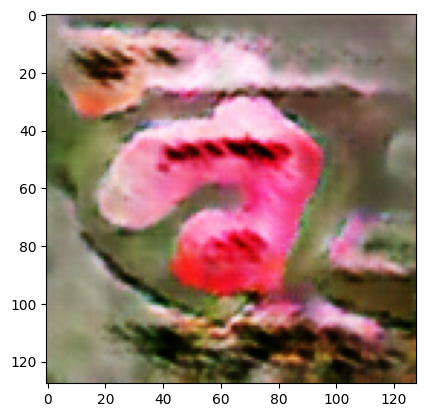

Epoch [470/500] loss_D: 0.7833 loss_G: 3.2486 time: 26.17
Epoch [471/500] loss_D: 0.8138 loss_G: 3.5846 time: 26.15
Epoch [472/500] loss_D: 0.8264 loss_G: 3.8268 time: 26.12
Epoch [473/500] loss_D: 0.6762 loss_G: 3.5082 time: 26.09
Epoch [474/500] loss_D: 0.7142 loss_G: 3.8284 time: 26.12
Epoch [475/500] loss_D: 0.5816 loss_G: 3.3431 time: 26.13
Epoch [476/500] loss_D: 0.7652 loss_G: 3.9136 time: 26.08
Epoch [477/500] loss_D: 0.6998 loss_G: 3.4103 time: 26.07
Epoch [478/500] loss_D: 0.7984 loss_G: 3.3531 time: 26.05
Epoch [479/500] loss_D: 0.9117 loss_G: 3.5555 time: 26.15


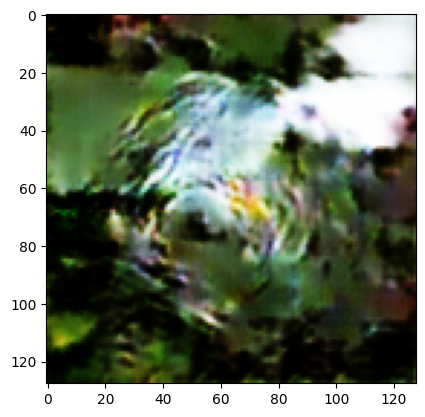

Epoch [480/500] loss_D: 0.7214 loss_G: 3.3833 time: 26.21
Epoch [481/500] loss_D: 0.6905 loss_G: 3.4439 time: 26.12
Epoch [482/500] loss_D: 0.8688 loss_G: 3.7953 time: 26.06
Epoch [483/500] loss_D: 0.7041 loss_G: 3.9748 time: 26.06
Epoch [484/500] loss_D: 0.9437 loss_G: 3.3979 time: 26.05
Epoch [485/500] loss_D: 0.8651 loss_G: 3.7701 time: 26.01
Epoch [486/500] loss_D: 0.5972 loss_G: 3.4811 time: 26.05
Epoch [487/500] loss_D: 0.7865 loss_G: 3.6801 time: 26.09
Epoch [488/500] loss_D: 0.8021 loss_G: 3.4545 time: 26.12
Epoch [489/500] loss_D: 0.6525 loss_G: 3.3219 time: 26.04


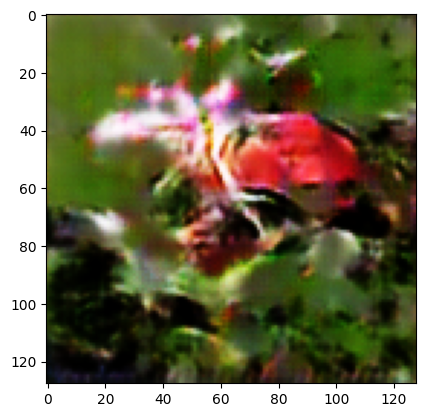

Epoch [490/500] loss_D: 0.8130 loss_G: 4.1112 time: 26.09
Epoch [491/500] loss_D: 0.7374 loss_G: 3.4173 time: 25.98
Epoch [492/500] loss_D: 0.8835 loss_G: 3.7440 time: 25.96
Epoch [493/500] loss_D: 0.6109 loss_G: 3.6165 time: 26.00
Epoch [494/500] loss_D: 0.7215 loss_G: 3.7273 time: 26.01
Epoch [495/500] loss_D: 0.6638 loss_G: 3.3651 time: 25.97
Epoch [496/500] loss_D: 0.7845 loss_G: 3.6419 time: 25.97
Epoch [497/500] loss_D: 0.5449 loss_G: 3.2648 time: 25.97
Epoch [498/500] loss_D: 0.8688 loss_G: 3.8731 time: 25.99
Epoch [499/500] loss_D: 0.7579 loss_G: 3.6045 time: 25.97


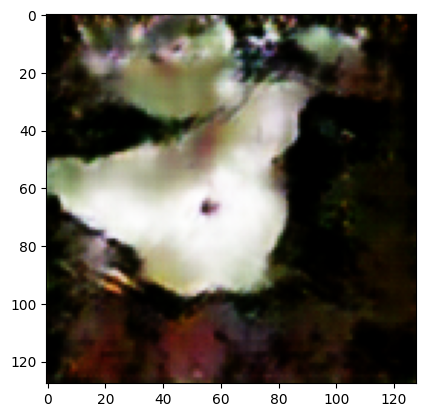

Epoch [500/500] loss_D: 1.0669 loss_G: 4.1205 time: 26.05


In [ ]:
import time

epochs = 500

for epoch in range(epochs):

    d_losses, g_losses = [], []

    epoch_time = time.time()

    for batch in dataloader:
        images = batch['image'].to(device)  # Đưa ảnh lên GPU
        embed_captions = batch['embed_caption'].to(device)  # Đưa captions lên GPU (đã là tensor)

        real_labels = torch.ones(images.size(0), 1, device=device)
        fake_labels = torch.zeros(images.size(0), 1, device=device)

        # Training the discriminator
        optimizer_D.zero_grad()

        noise = torch.randn(size=(images.size(0), 100), device=device)
        fake_images = generator(noise, embed_captions)

        real_labels = torch.ones(images.size(0), 1, device=device)
        fake_labels = torch.zeros(images.size(0), 1, device=device)

        real_loss = criterion(
            discriminator(images, embed_captions),
            real_labels
        )
        fake_loss = criterion(
            discriminator(fake_images.detach(), embed_captions),
            fake_labels
        )
        d_loss = real_loss + fake_loss

        d_loss.backward()
        optimizer_D.step()

        d_losses.append(d_loss.item())

        # Training generator
        optimizer_G.zero_grad()
        noise = torch.randn(size=(images.size(0), 100), device=device)
        fake_images = generator(noise, embed_captions)

        g_loss = criterion(
            discriminator(fake_images, embed_captions),
            real_labels
        )

        g_loss.backward()
        optimizer_G.step()

        g_losses.append(g_loss.item())

    avg_d_loss = sum(d_losses)/len(d_losses)
    avg_g_loss = sum(g_losses)/len(g_losses)

    if (epoch+1) % 10 == 0:
        plot_output(generator)

    print('Epoch [{}/{}] loss_D: {:.4f} loss_G: {:.4f} time: {:.2f}'.format(
        epoch+1, epochs,
        avg_d_loss,
        avg_g_loss,
        time.time() - epoch_time)
    )

In [ ]:
import torch

# Save generator
torch.save(generator.state_dict(), 'generator_contrastive.pth')

# Save discriminator
torch.save(discriminator.state_dict(), 'discriminator_contrastive.pth')

In [ ]:
ds[4]['text']

'this pale pink flower has a large yellow and green pistil.'

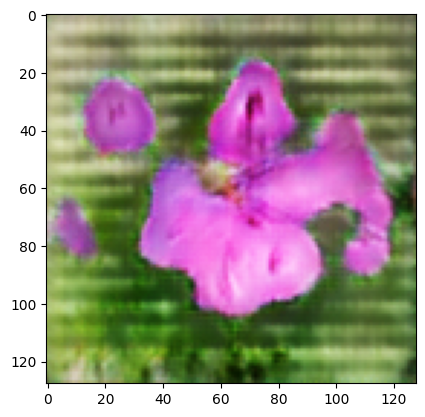

In [ ]:
generator.eval()

noise = torch.randn(size=(1, 100))
text_embedding = ds[4]['embed_caption'].unsqueeze(0)
with torch.no_grad():
    test_images = generator(noise.to(device), text_embedding.to(device))
grid = torchvision.utils.make_grid(test_images.cpu(), normalize=True)
show_grid(grid)